In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import warnings; warnings.filterwarnings('ignore')

In [3]:
import tensorflow as tf

In [4]:
import numpy as np

In [5]:
import cv2

In [6]:
import matplotlib.pyplot as plt
%matplotlib inline

In [7]:
from configs import CONFIG_MAP



The TensorFlow contrib module will not be included in TensorFlow 2.0.
For more information, please see:
  * https://github.com/tensorflow/community/blob/master/rfcs/20180907-contrib-sunset.md
  * https://github.com/tensorflow/addons
  * https://github.com/tensorflow/io (for I/O related ops)
If you depend on functionality not listed there, please file an issue.



In [8]:
from trained_model import TrainedModel

In [9]:
from image_vae import Autoencoder

In [10]:
from pathlib import Path

In [11]:
from magenta.music import sequence_proto_to_midi_file

In [12]:
from magenta.music.notebook_utils import play_sequence, plot_sequence

In [13]:
from IPython.display import display

In [14]:
from ipywidgets import VBox, Layout, Image, Audio

In [15]:
import PIL

In [16]:
from magenta.scripts.convert_dir_to_note_sequences import convert_midi

In [17]:
import pandas as pd

In [18]:
config = CONFIG_MAP['cat-mel_2bar_small']

In [19]:
checkpoint_dir = '../../checkpoints13/train'

In [20]:
tf.reset_default_graph()

In [21]:
model = TrainedModel(config, 16, checkpoint_dir)


INFO:tensorflow:Building MusicVAE model with BidirectionalLstmEncoder, CategoricalLstmDecoder, and hparams:
{'max_seq_len': 32, 'z_size': 256, 'free_bits': 0, 'max_beta': 0.2, 'beta_rate': 0.99999, 'batch_size': 16, 'grad_clip': 1.0, 'clip_mode': 'global_norm', 'grad_norm_clip_to_zero': 10000, 'learning_rate': 0.001, 'decay_rate': 0.9999, 'min_learning_rate': 1e-05, 'conditional': True, 'dec_rnn_size': [256, 256], 'enc_rnn_size': [512], 'dropout_keep_prob': 1.0, 'sampling_schedule': 'inverse_sigmoid', 'sampling_rate': 1000, 'use_cudnn': False, 'residual_encoder': False, 'residual_decoder': False, 'image_batch_size': 16}

yayayayaya
INFO:tensorflow:
Encoder Cells (bidirectional):
  units: [512]


Instructions for updating:
This class is equivalent as tf.keras.layers.StackedRNNCells, and will be replaced by that in Tensorflow 2.0.
INFO:tensorflow:
Decoder Cells:
  units: [256, 256]



Instructions for updating:
Use `tf.cast` instead.







Instructions for updating:
Use keras.layers.De

In [39]:
midi_pos = list(map(str, Path('/home/niharg/Documents/MS/Fall 2019/CSCI566/music_data/test/positive/').glob('*.mid')))
midi_neg = list(map(str, Path('/home/niharg/Documents/MS/Fall 2019/CSCI566/music_data/test/negative/').glob('*.mid')))

In [40]:
image_pos = list(map(str, Path('/home/niharg/Documents/MS/Fall 2019/CSCI566/image_data/test/positive/').glob('*.jpg')))
image_neg = list(map(str, Path('/home/niharg/Documents/MS/Fall 2019/CSCI566/image_data/test/negative/').glob('*.jpg')))

In [41]:
def decode_img(path):
    img = cv2.imread(path)
    img = np.asarray(img).astype(np.float32) / 255.
    img = cv2.resize(img, (64, 64))
    return img

In [42]:
def visualize_image_to_music(model: TrainedModel, image_paths: list):
    images = np.stack([decode_img(path) for path in image_paths], axis=0)
    print('Image Shape and dtype: ', images.shape, images.dtype)
    output_ns = model.image_to_music(images)
    print('Output notesequences: ', len(output_ns))
    for i, ns in enumerate(output_ns):
        image = PIL.Image.fromarray((images[i] * 255.).astype(np.uint8))
        display(image.resize((256, 256)))
        plot_sequence(ns)
        play_sequence(ns)

Image Shape and dtype:  (5, 64, 64, 3) float32
Output notesequences:  5


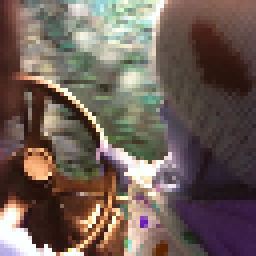

Loading BokehJS ...

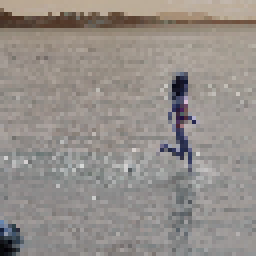

Loading BokehJS ...

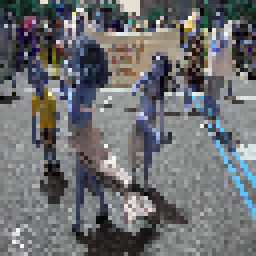

Loading BokehJS ...

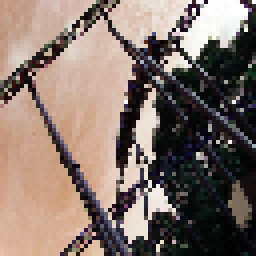

Loading BokehJS ...

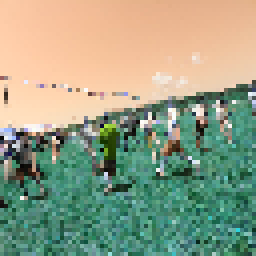

Loading BokehJS ...

In [43]:
images_pos_sample = np.random.choice(image_pos, size=5, replace=False)
visualize_image_to_music(model, images_pos_sample)

Image Shape and dtype:  (5, 64, 64, 3) float32
Output notesequences:  5


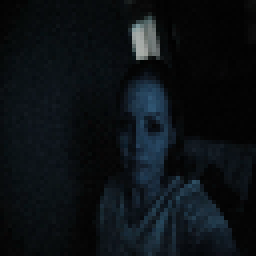

Loading BokehJS ...

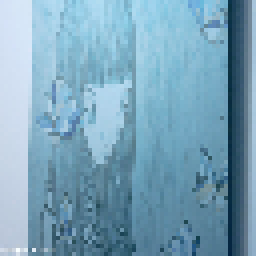

Loading BokehJS ...

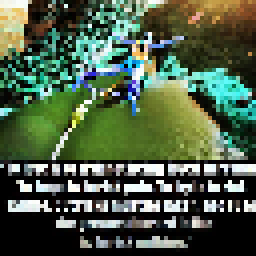

Loading BokehJS ...

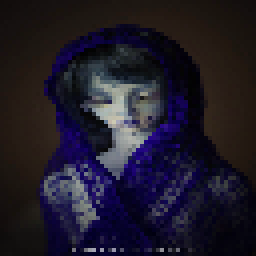

Loading BokehJS ...

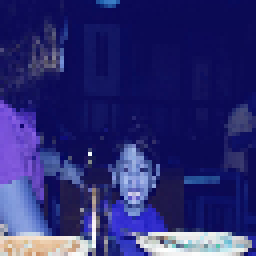

Loading BokehJS ...

In [44]:
images_neg_sample = np.random.choice(image_neg, size=5, replace=False)
visualize_image_to_music(model, images_neg_sample)

In [36]:
def visualize_music_to_image(model: TrainedModel, midi_paths: list):
    nss = [convert_midi('', '', path) for path in midi_paths]
    result_midis = list()
    for midi in nss:
        if midi is not None:
            tensors = config.data_converter.to_tensors(midi)
            if len(tensors[0]) > 0:
                ns = config.data_converter.to_notesequences(tensors[0])
                idx = np.random.choice(len(ns), size=1).astype(np.int32)[0]
                result_midis.append(ns[idx])
    
    output_imgs = model.music_to_image(result_midis)
    for i, img in enumerate(output_imgs):
        plot_sequence(result_midis[i])
        play_sequence(result_midis[i])
        image = PIL.Image.fromarray((img * 255.).astype(np.uint8))
        display(image.resize((256, 256)))

INFO:tensorflow:Converted MIDI file /home/niharg/Documents/MS/Fall 2019/CSCI566/music_data/test/positive/Who Do You Think You Are.2.mid.
INFO:tensorflow:Converted MIDI file /home/niharg/Documents/MS/Fall 2019/CSCI566/music_data/test/positive/Hanky Panky.mid.
INFO:tensorflow:Converted MIDI file /home/niharg/Documents/MS/Fall 2019/CSCI566/music_data/test/positive/Too Much.3.mid.
INFO:tensorflow:Converted MIDI file /home/niharg/Documents/MS/Fall 2019/CSCI566/music_data/test/positive/Holiday.mid.
INFO:tensorflow:Converted MIDI file /home/niharg/Documents/MS/Fall 2019/CSCI566/music_data/test/positive/Frozen.4.mid.


Loading BokehJS ...

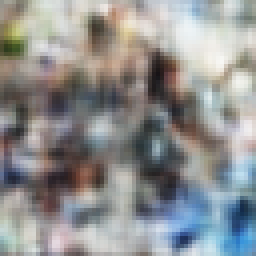

Loading BokehJS ...

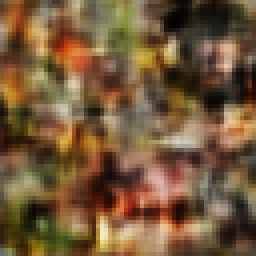

Loading BokehJS ...

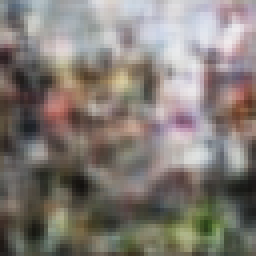

Loading BokehJS ...

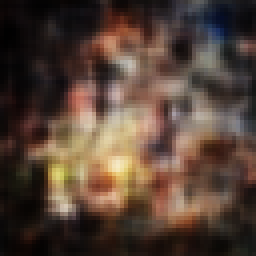

Loading BokehJS ...

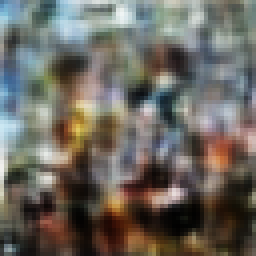

In [45]:
midi_pos_sample = np.random.choice(midi_pos, size=5, replace=False)
visualize_music_to_image(model, midi_pos_sample)

INFO:tensorflow:Converted MIDI file /home/niharg/Documents/MS/Fall 2019/CSCI566/music_data/test/negative/Dont Tread on Me.mid.
INFO:tensorflow:Converted MIDI file /home/niharg/Documents/MS/Fall 2019/CSCI566/music_data/test/negative/One.3.mid.
INFO:tensorflow:Converted MIDI file /home/niharg/Documents/MS/Fall 2019/CSCI566/music_data/test/negative/The Thing That Should Not Be.1.mid.
INFO:tensorflow:Converted MIDI file /home/niharg/Documents/MS/Fall 2019/CSCI566/music_data/test/negative/Highway To Hell.mid.
INFO:tensorflow:Converted MIDI file /home/niharg/Documents/MS/Fall 2019/CSCI566/music_data/test/negative/Dyers Eve.mid.


Loading BokehJS ...

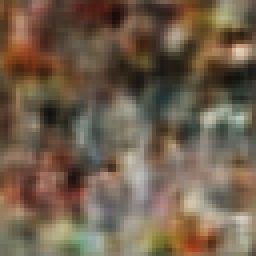

Loading BokehJS ...

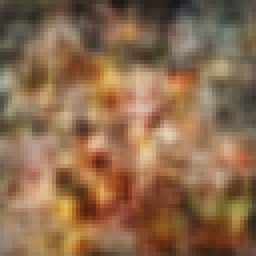

Loading BokehJS ...

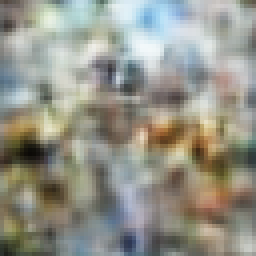

Loading BokehJS ...

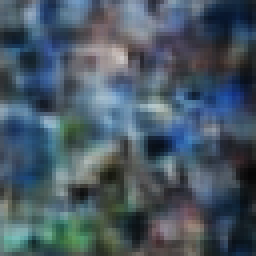

In [46]:
midi_neg_sample = np.random.choice(midi_neg, size=5, replace=False)
visualize_music_to_image(model, midi_neg_sample)